# Chapter 3 Generate Images Using Stable Diffusion

## Prepare and Sign to Hugging Face

In [ ]:
# Login to hugging face for model downloading
from huggingface_hub import login
login()

## Generate image from text

### Use the default Stable Diffusion v1.5 model

In [14]:
# Load up model
import torch
from diffusers import StableDiffusionPipeline

text2img_pipe = StableDiffusionPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5"
    , torch_dtype = torch.float16
).to("cuda:0")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

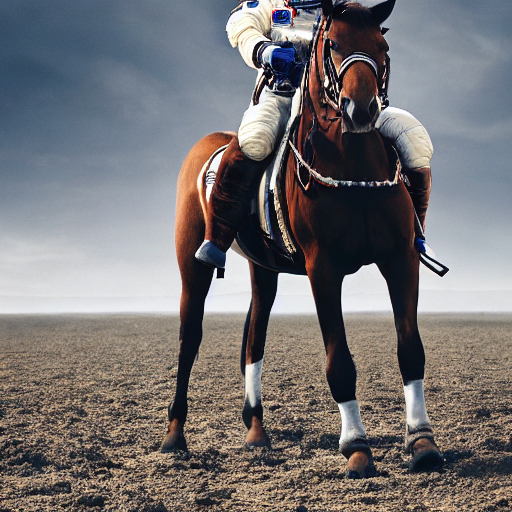

In [15]:
# generate an image
prompt = "high resolution, a photograph of an astronaut riding a horse"
image = text2img_pipe(
    prompt = prompt
).images[0]
image

  0%|          | 0/50 [00:00<?, ?it/s]

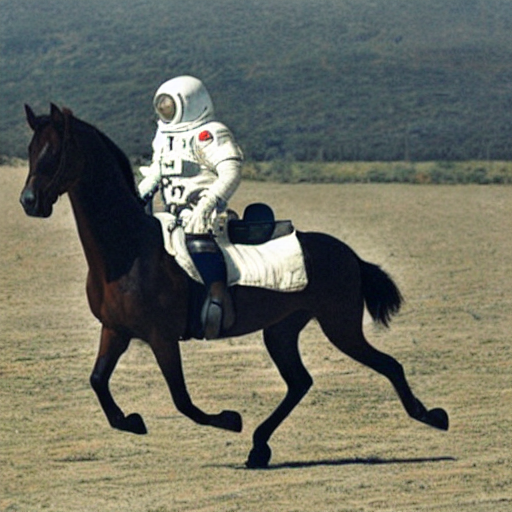

In [16]:
generator = torch.Generator("cuda:0").manual_seed(1234)
prompt = "high resolution, a photograph of an astronaut riding a horse"
image = text2img_pipe(
    prompt = prompt
    , generator = generator
).images[0]
display(image)

### Stable Diffusion Scheduler

In [17]:
# Check out the current schduler
text2img_pipe.scheduler

PNDMScheduler {
  "_class_name": "PNDMScheduler",
  "_diffusers_version": "0.27.2",
  "beta_end": 0.012,
  "beta_schedule": "scaled_linear",
  "beta_start": 0.00085,
  "clip_sample": false,
  "num_train_timesteps": 1000,
  "prediction_type": "epsilon",
  "set_alpha_to_one": false,
  "skip_prk_steps": true,
  "steps_offset": 1,
  "timestep_spacing": "leading",
  "trained_betas": null
}

  0%|          | 0/50 [00:00<?, ?it/s]

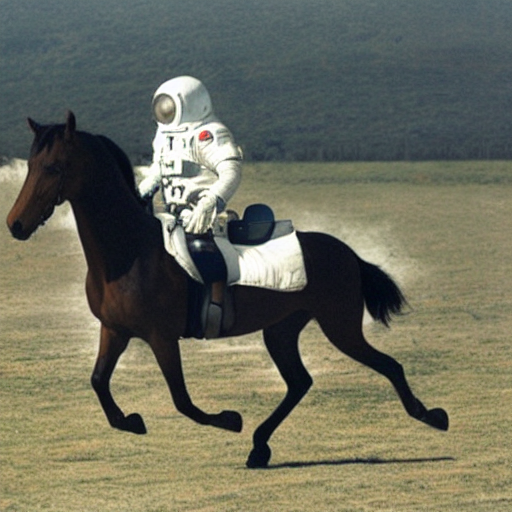

In [18]:
from diffusers import EulerDiscreteScheduler
text2img_pipe.scheduler = EulerDiscreteScheduler.from_config(text2img_pipe.scheduler.config)
generator = torch.Generator("cuda:0").manual_seed(1234)
prompt = "high resolution, a photograph of an astronaut riding a horse"
image = text2img_pipe(
    prompt = prompt
    , generator = generator
).images[0]
display(image)

#### Euler scheduler with 20 steps

  0%|          | 0/20 [00:00<?, ?it/s]

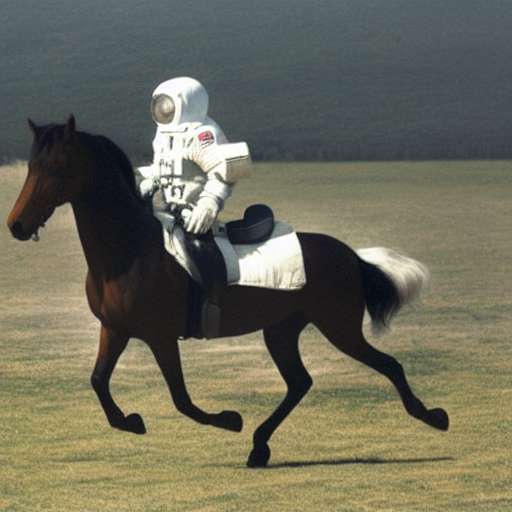

In [19]:
from diffusers import EulerDiscreteScheduler
text2img_pipe.scheduler = EulerDiscreteScheduler.from_config(text2img_pipe.scheduler.config)
generator = torch.Generator("cuda:0").manual_seed(1234)
prompt = "high resolution, a photograph of an astronaut riding a horse"
image = text2img_pipe(
    prompt = prompt
    , generator = generator
    , num_inference_steps = 20
).images[0]
display(image)

#### PNDMScheduler scheuler with 20 steps

  0%|          | 0/20 [00:00<?, ?it/s]

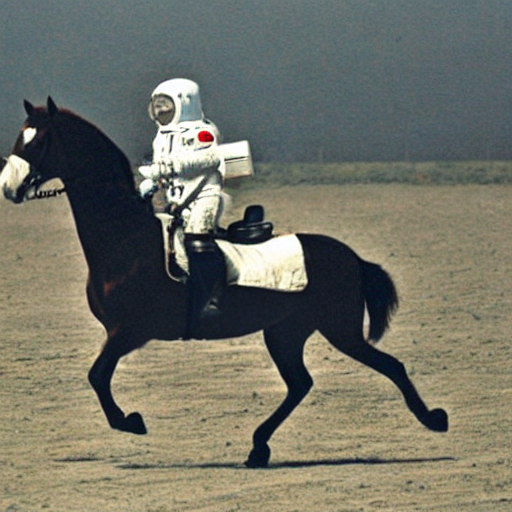

In [20]:
from diffusers import PNDMScheduler 
text2img_pipe.scheduler = PNDMScheduler .from_config(text2img_pipe.scheduler.config)
generator = torch.Generator("cuda:0").manual_seed(1234)
prompt = "high resolution, a photograph of an astronaut riding a horse"
image = text2img_pipe(
    prompt = prompt
    , generator = generator
    , num_inference_steps = 20
).images[0]
display(image)

#### Use DPMSolverMultistepScheduler scheduler

  0%|          | 0/50 [00:00<?, ?it/s]

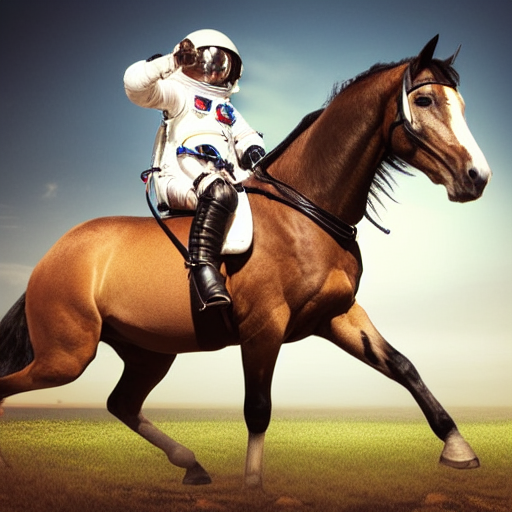

In [21]:
# Different scheduler will generate different images
from diffusers import DPMSolverMultistepScheduler
text2img_pipe.scheduler = DPMSolverMultistepScheduler.from_config(text2img_pipe.scheduler.config)
prompt = "high resolution, a photograph of an astronaut riding a horse"
image = text2img_pipe(
    prompt = prompt
    , generator = generator
).images[0]
image

### Use the deliberate-v2 for better image

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

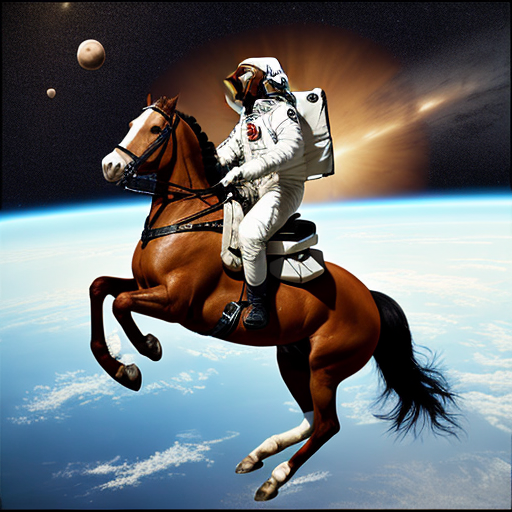

In [28]:
# Change model to "stablediffusionapi/deliberate-v2"
from diffusers import StableDiffusionPipeline
import torch

text2img_pipe.scheduler = DPMSolverMultistepScheduler.from_config(text2img_pipe.scheduler.config)
text2img_pipe = StableDiffusionPipeline.from_pretrained(
    "stablediffusionapi/deliberate-v2"
    , torch_dtype = torch.float16
).to("cuda:0")

prompt = "high resolution, a photograph of an astronaut riding a horse"
image = text2img_pipe(
    prompt = prompt
).images[0]
display(image)

### Generate image with deterministic generation

  0%|          | 0/50 [00:00<?, ?it/s]

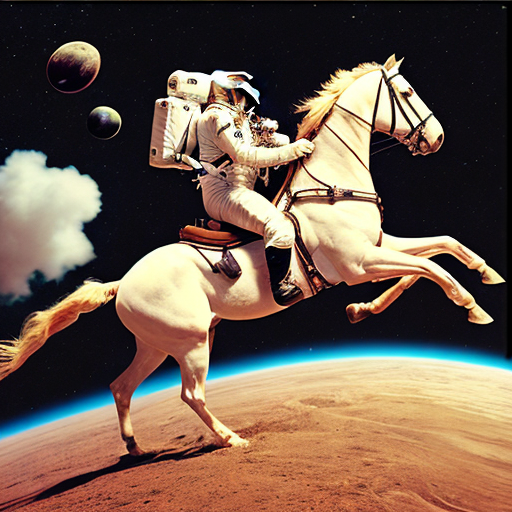

In [29]:
generator = torch.Generator("cuda:0").manual_seed(1)
prompt = "high resolution, a photograph of an astronaut riding a horse"
image = text2img_pipe(
    prompt = prompt
    , generator = generator
).images[0]
image

#### Use random generator, you will get different images every time run this cell

  0%|          | 0/50 [00:00<?, ?it/s]

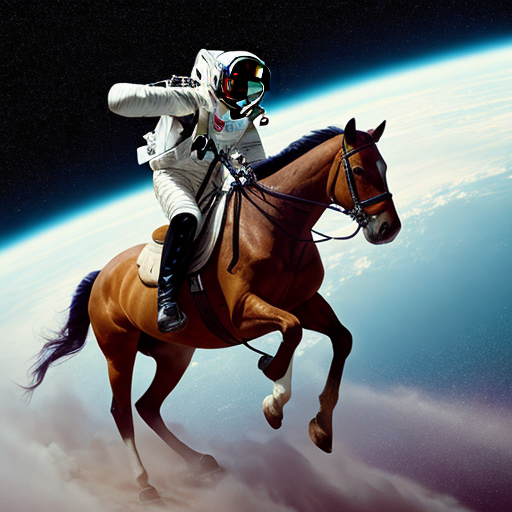

In [30]:
import random
seed = random.randint(1,999999)
generator = torch.Generator("cuda:0").manual_seed(seed)
prompt = "high resolution, a photograph of an astronaut riding a horse"
image = text2img_pipe(
    prompt = prompt
    , generator = generator
).images[0]
image

### Specify inference steps

  0%|          | 0/30 [00:00<?, ?it/s]

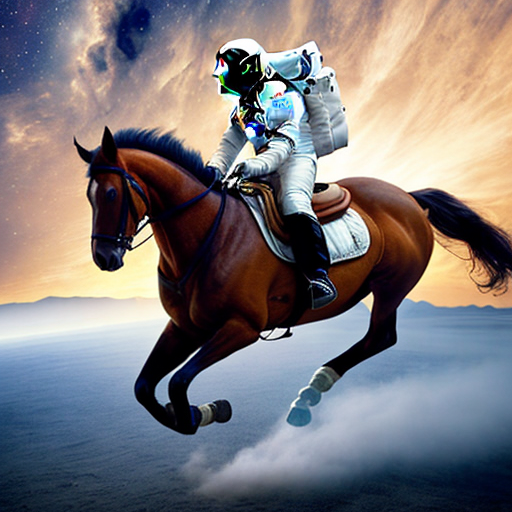

In [31]:
# Generate image using assigned steps
prompt = "high resolution, a photograph of an astronaut riding a horse"
image = text2img_pipe(
    prompt = prompt
    , num_inference_steps = 30
).images[0]
image

### Guidance Scale

In [32]:
import torch
generator = torch.Generator("cuda:0").manual_seed(123)

prompt = "high resolution, a photograph of an astronaut riding a horse on mars"

image_3_gs = text2img_pipe(
    prompt = prompt
    , num_inference_steps = 30
    , guidance_scale = 3
    , generator = generator
).images[0]

image_7_gs = text2img_pipe(
    prompt = prompt
    , num_inference_steps = 30
    , guidance_scale = 7
    , generator = generator
).images[0]

image_10_gs = text2img_pipe(
    prompt = prompt
    , num_inference_steps = 30
    , guidance_scale = 10
    , generator = generator
).images[0]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

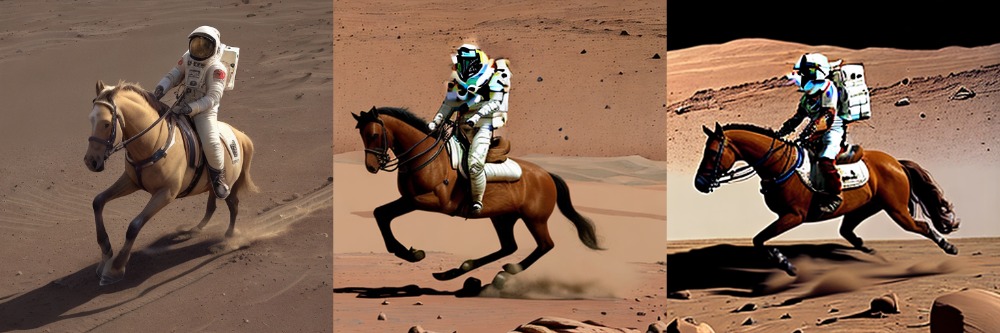

In [10]:
from diffusers.utils import make_image_grid
images = [image_3_gs,image_7_gs,image_10_gs]
make_image_grid(images,rows=1,cols=3)

### Specify the image size

  0%|          | 0/40 [00:00<?, ?it/s]

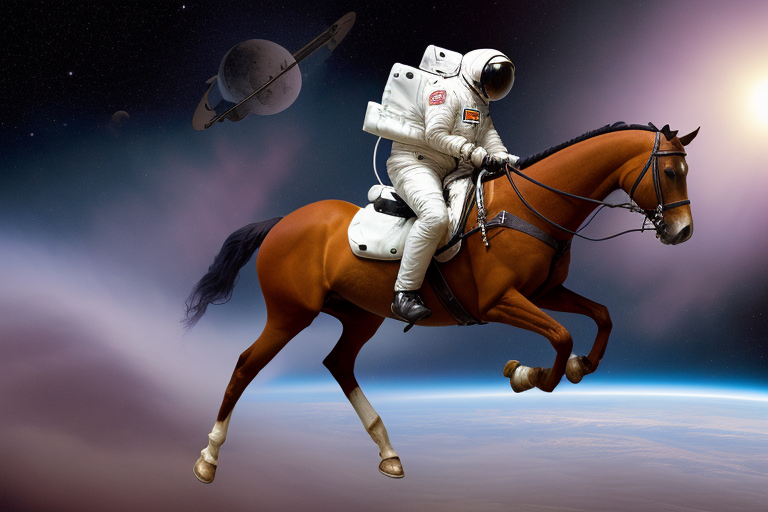

In [51]:
prompt = "high resolution, a photograph of an astronaut riding a horse"

from diffusers import EulerDiscreteScheduler
text2img_pipe.scheduler = EulerDiscreteScheduler.from_config(text2img_pipe.scheduler.config)
image = text2img_pipe(
    prompt = prompt
    , num_inference_steps = 40
    , guidance_scale = 7.5
    , width = 768
    , height = 512
    , generator = torch.Generator("cuda:0").manual_seed(2) 
).images[0]
image

## Text Guided Image Inpainting

In [42]:
# load CLIPSeg 
from transformers import CLIPSegProcessor,CLIPSegForImageSegmentation

processor = CLIPSegProcessor.from_pretrained(
    "CIDAS/clipseg-rd64-refined"
)
model = CLIPSegForImageSegmentation.from_pretrained(
    "CIDAS/clipseg-rd64-refined"
)

Unused or unrecognized kwargs: padding.


torch.Size([352, 352])


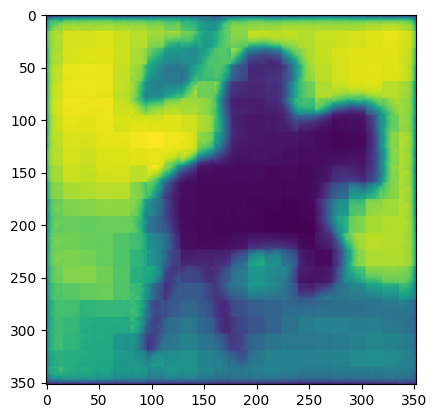

In [52]:
# generate mask data
import matplotlib.pyplot as plt
import torch

prompts = ['the background']
inputs = processor(
    text             = prompts
    , images         = [image] * len(prompts)
    , padding        = True
    , return_tensors = "pt"
)

with torch.no_grad():
    outputs = model(**inputs)

preds = outputs.logits

mask_data = torch.sigmoid(preds)[0]
print(mask_data.shape)
plt.imshow(mask_data)

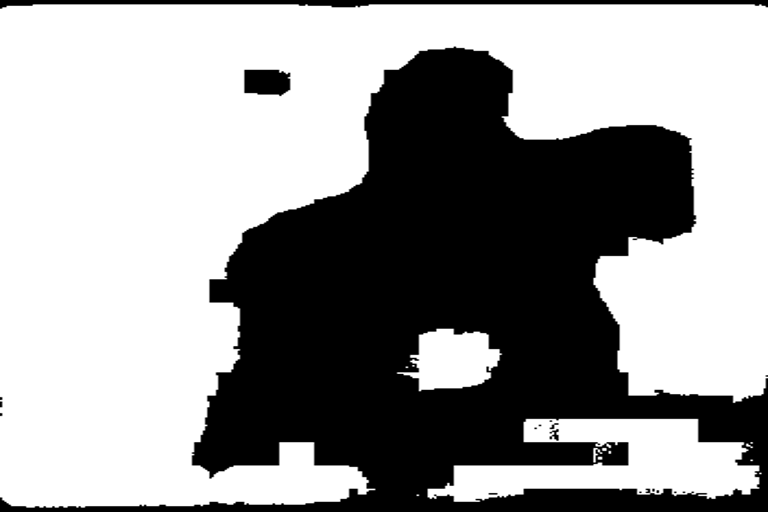

In [53]:
# genearte mask binary image
import cv2
from PIL import Image
mask_file_name = f"bg_mask.png"
plt.imsave(mask_file_name,mask_data) 
mask_data_cv = cv2.imread(mask_file_name) # -> (352, 352, 3)

def get_mask_img(mask_data):
    gray_image = cv2.cvtColor(mask_data,cv2.COLOR_BGR2GRAY)
    thresh, bw_image = cv2.threshold(gray_image,100,255,cv2.THRESH_BINARY)
    cv2.cvtColor(bw_image, cv2.COLOR_BGR2RGB)
    return Image.fromarray(bw_image)

bw_image = get_mask_img(mask_data=mask_data_cv)
#cv2.imwrite(bw_image)
bw_image = bw_image.resize((768,512))
bw_image

In [45]:
from diffusers import StableDiffusionInpaintPipeline, EulerDiscreteScheduler
inpaint_pipe = StableDiffusionInpaintPipeline.from_pretrained(
    "CompVis/stable-diffusion-v1-4"
    , torch_dtype = torch.float16
    , safety_checker = None
).to("cuda:0")


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.deprecated.stable_diffusion_variants.pipeline_stable_diffusion_inpaint_legacy.StableDiffusionInpaintPipelineLegacy'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


  0%|          | 0/50 [00:00<?, ?it/s]

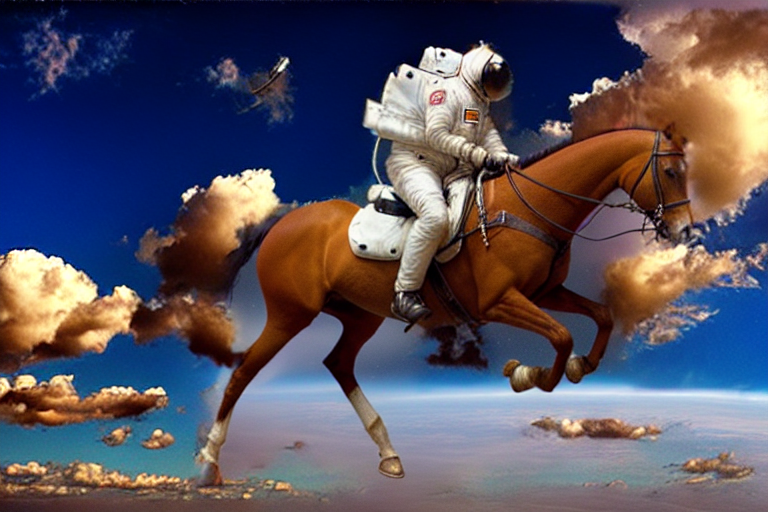

In [54]:
prompt = "blue sky, clouds"
inpaint_pipe.scheduler = EulerDiscreteScheduler.from_config(inpaint_pipe.scheduler.config)
inpaint_image = inpaint_pipe(
    prompt                  = prompt
    , image                 = image
    , mask_image            = bw_image
    , num_inference_steps   = 50
    , guidance_scale        = 9
    , strength              = 1
    #, width                 = 768
    #, height                = 512
    , generator             = torch.Generator("cuda:0").manual_seed(1) 
).images[0]
inpaint_image

## Using Img2Img pipeline

In [55]:
import torch 
from diffusers import (
    StableDiffusionImg2ImgPipeline
    , EulerDiscreteScheduler
)

import torch
from diffusers import StableDiffusionPipeline
img2img_pipe = StableDiffusionImg2ImgPipeline.from_pretrained(
    "stablediffusionapi/deliberate-v2"
    , torch_dtype = torch.float16
).to("cuda:0")


/home/andrewzhu/storage_1t_1/az_git_folder/Using-Stable-Diffusion-with-Python/sd_book_prd_p310_venv/lib/python3.10/site-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

/home/andrewzhu/storage_1t_1/az_git_folder/Using-Stable-Diffusion-with-Python/sd_book_prd_p310_venv/lib/python3.10/site-packages/transformers/models/clip/feature_extraction_clip.py:28: FutureWarning: The class CLIPFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use CLIPImageProcessor instead.
  warnings.warn(


  0%|          | 0/25 [00:00<?, ?it/s]

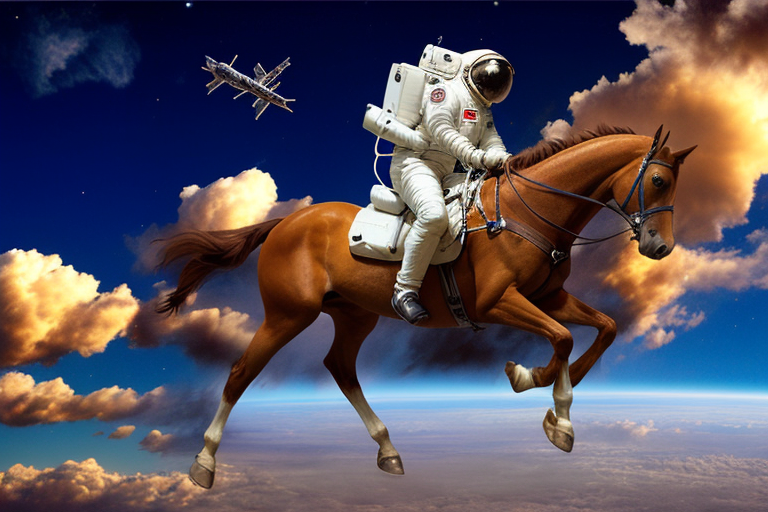

In [56]:
img2img_pipe.scheduler = EulerDiscreteScheduler.from_config(img2img_pipe.scheduler.config)
prompt = "super clear details, high resolution, a photograph of an astronaut riding a horse"
img2img_pipe.scheduler = EulerDiscreteScheduler.from_config(inpaint_pipe.scheduler.config)
fixed_image = img2img_pipe(
    image                   = inpaint_image
    , prompt                = prompt
    , num_inference_steps   = 50
    , guidance_scale        = 7.5
    , strength              = 0.5
).images[0]
fixed_image


## Add detail to image using img2img

  0%|          | 0/50 [00:00<?, ?it/s]

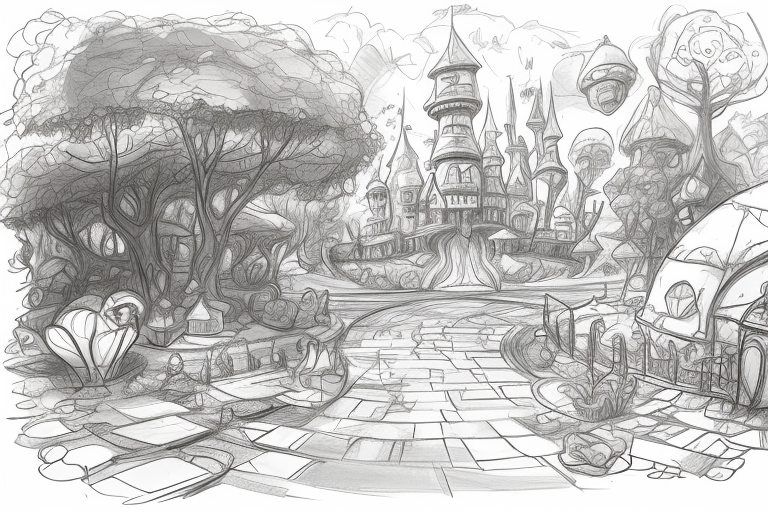

In [57]:
prompt = "child sketch of a wonderland"
image = text2img_pipe(
    prompt = prompt
    , generator = torch.Generator("cuda:0").manual_seed(1234)
    , width = 768
    , height = 512
).images[0]
image

  0%|          | 0/36 [00:00<?, ?it/s]

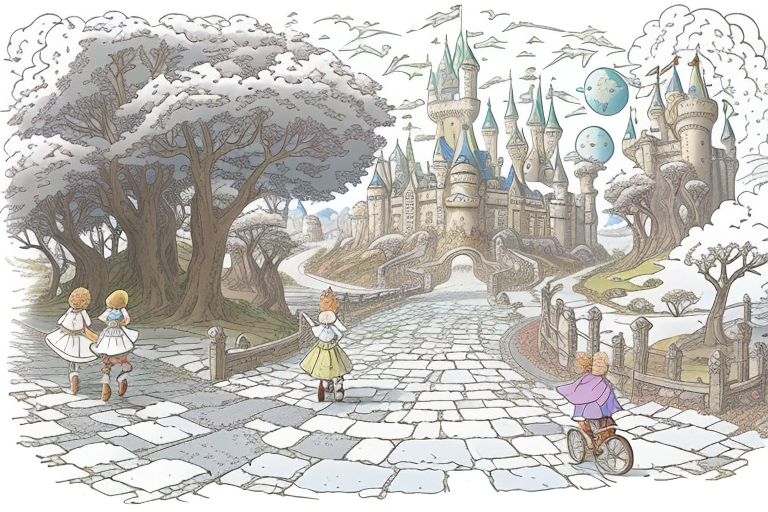

In [58]:
enrich_prompt = "a fantasy wonderland with castles, colorful, two kids on the road"
neg_prompt = "black white sketch, gray scale"

img2img_w_details = img2img_pipe(
    prompt                  = enrich_prompt
    , negative_prompt       = neg_prompt
    , image                 = image
    , num_inference_steps   = 120
    , guidance_scale        = 16
    , strength              = 0.3
    , generator             = torch.Generator("cuda:0").manual_seed(1)
).images[0]
img2img_w_details